In [31]:
import alphashape
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.cm import viridis_r
from scipy.interpolate import griddata
from sklearn.preprocessing import MinMaxScaler
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from shapely.geometry import Polygon, MultiPolygon, Point
from matplotlib.colors import ListedColormap, BoundaryNorm

In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.interpolate import griddata
from sklearn.cluster import KMeans

data_ie_path = "C:/Users/datta/Downloads/28-000001_2019-05-20_IE_reconstructed.csv"

data_ie = pd.read_csv(data_ie_path)


x_ie = data_ie['XLocation']
y_ie = data_ie['YLocation']
z_ie = data_ie['PeakFrequency']

peak_freqs = data_ie['PeakFrequency'].values.reshape(-1, 1)

n_clusters = 3
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
data_ie['Cluster'] = kmeans.fit_predict(peak_freqs)

cluster_centers = kmeans.cluster_centers_.flatten()
sorted_indices = np.argsort(cluster_centers)
cluster_map = {old: new for new, old in enumerate(sorted_indices)}
data_ie['Cluster'] = data_ie['Cluster'].map(cluster_map)

print(f"Cluster Centers (sorted): {sorted(cluster_centers)}")

C:\Users\datta\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:110: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\datta\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 199, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\datta\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\datta\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\datta\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreatePro

Cluster Centers (sorted): [1.2066987762966557, 5.990648701344519, 10.591426065412948]


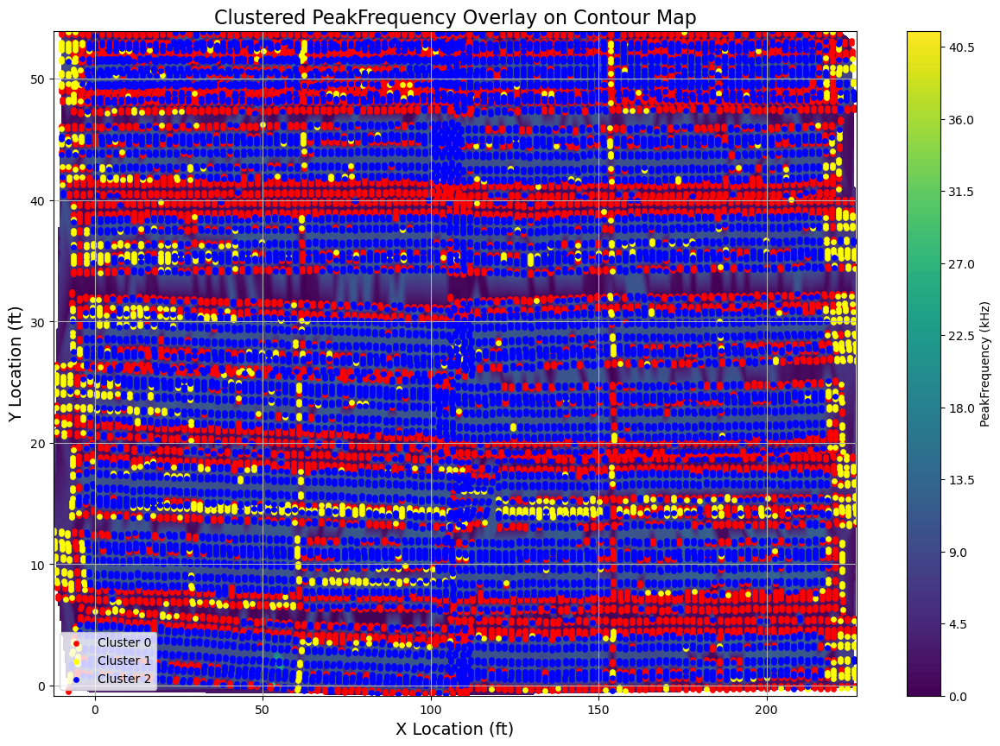

In [33]:
xi = np.linspace(x_ie.min(), x_ie.max(), 500)
yi = np.linspace(y_ie.min(), y_ie.max(), 500)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((x_ie, y_ie), z_ie, (xi, yi), method='linear')

plt.figure(figsize=(15, 10))

contour = plt.contourf(xi, yi, zi, levels=100, cmap='viridis')
plt.colorbar(contour, label='PeakFrequency (kHz)')

colors = ['red', 'yellow', 'blue']
for cluster_label in range(n_clusters):
    cluster_data = data_ie[data_ie['Cluster'] == cluster_label]
    plt.scatter(cluster_data['XLocation'], cluster_data['YLocation'],
                color=colors[cluster_label], label=f'Cluster {cluster_label}', s=15)


plt.xlabel('X Location (ft)', fontsize=14)
plt.ylabel('Y Location (ft)', fontsize=14)
plt.title('Clustered PeakFrequency Overlay on Contour Map', fontsize=16)
plt.legend()
plt.grid(True)
plt.show()


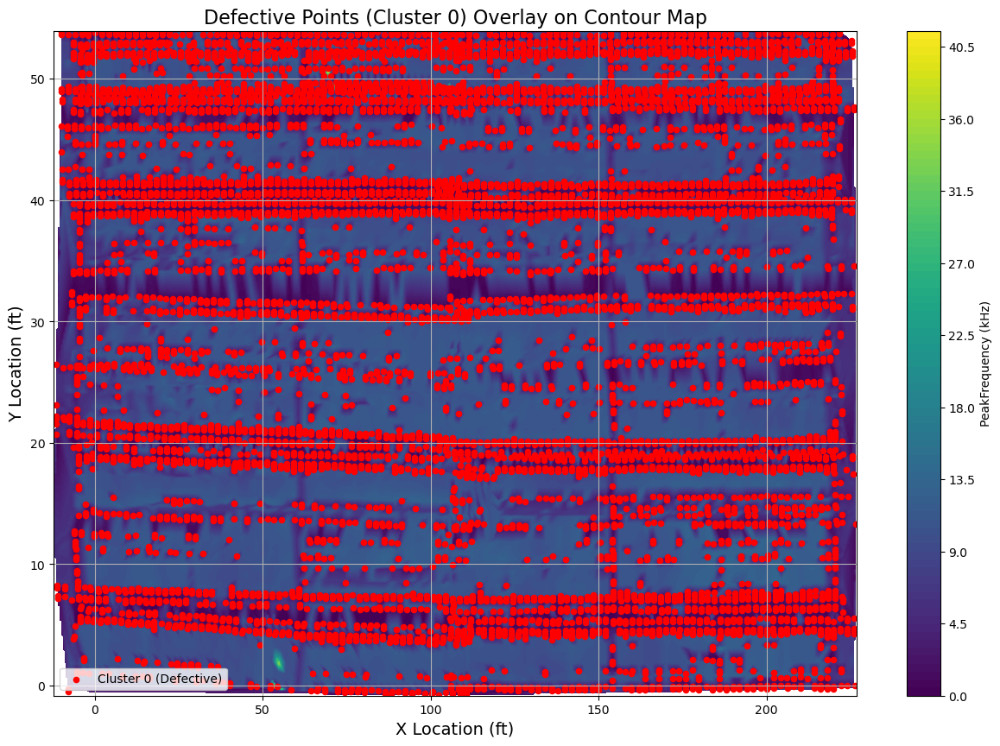

In [34]:

least_cluster_data = data_ie[data_ie['Cluster'] == 0]


plt.figure(figsize=(15, 10))

contour = plt.contourf(xi, yi, zi, levels=100, cmap='viridis')
plt.colorbar(contour, label='PeakFrequency (kHz)')

plt.scatter(least_cluster_data['XLocation'], least_cluster_data['YLocation'],
            color='red', label='Cluster 0 (Defective)', s=20)

plt.xlabel('X Location (ft)', fontsize=14)
plt.ylabel('Y Location (ft)', fontsize=14)
plt.title('Defective Points (Cluster 0) Overlay on Contour Map', fontsize=16)
plt.legend()
plt.grid(True)
plt.show()


In [35]:
max_frequency_cluster_0 = least_cluster_data['PeakFrequency'].max()

print(f"Highest PeakFrequency in Cluster 0: {max_frequency_cluster_0} kHz")

Highest PeakFrequency in Cluster 0: 3.522504892367905 kHz


In [36]:
# Determine the frequency range for Cluster 0
cluster_0_freq_range = (least_cluster_data['PeakFrequency'].min(),
                        least_cluster_data['PeakFrequency'].max())

print(f"Cluster 0 Frequency Range: {cluster_0_freq_range[0]} kHz to {cluster_0_freq_range[1]} kHz")


Cluster 0 Frequency Range: 0.0 kHz to 3.522504892367905 kHz


In [37]:
# Create a DataFrame for Cluster 0
cluster_0_df = least_cluster_data[['XLocation', 'YLocation', 'PeakFrequency']]

# Display the first few rows of the Cluster 0 DataFrame
print(cluster_0_df.head())

# Save the DataFrame to a CSV file for further use
output_path = 'C:/Users/datta/Downloads/cluster_0_defective_points.csv'
cluster_0_df.to_csv(output_path, index=False)

print(f"Cluster 0 DataFrame saved to: {output_path}")

    XLocation  YLocation  PeakFrequency
2  105.885449   4.031899       1.174168
3  105.881300   4.250593       1.174168
4  105.877150   4.469320       1.174168
5  105.873001   4.688015       1.565558
6  105.860553   5.344163       0.782779
Cluster 0 DataFrame saved to: C:/Users/datta/Downloads/cluster_0_defective_points.csv


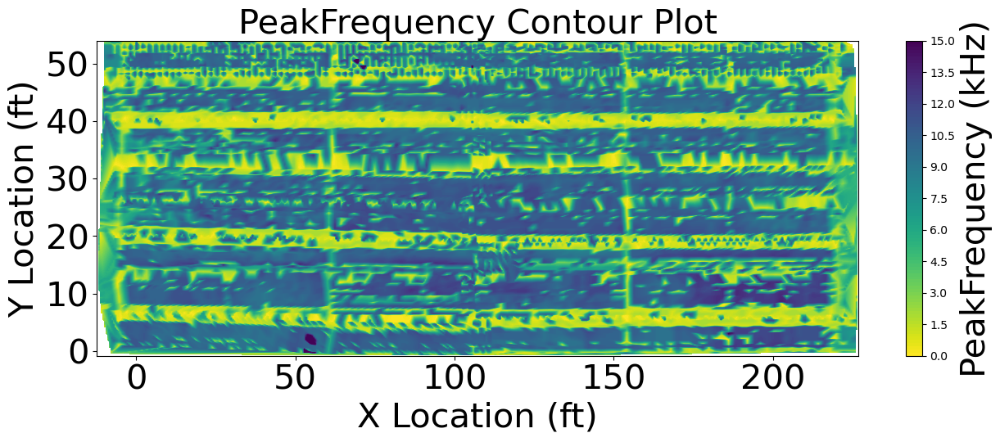

In [38]:
data_ie = pd.read_csv("C:/Users/datta/Downloads/28-000001_2019-05-20_IE_reconstructed.csv")


x_ie = data_ie['XLocation']
y_ie = data_ie['YLocation']
z_ie = data_ie['PeakFrequency']


xi = np.linspace(x_ie.min(), x_ie.max(), 500)
yi = np.linspace(y_ie.min(), y_ie.max(), 500)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((x_ie, y_ie), z_ie, (xi, yi), method='linear')


zi = np.clip(zi, 0, 15)


colors_ie = ['#ff0000', '#ff6600', '#ffcc00', '#00ff66', '#00ffff', '#0000ff']
custom_cmap_ie = LinearSegmentedColormap.from_list("custom_scale", colors_ie)

num_levels = 100
levels = np.linspace(0, 15, num_levels)

plt.figure(figsize=(15, 5))
contour = plt.contourf(xi, yi, zi, levels=levels, cmap=viridis_r)

cbar = plt.colorbar(contour)
cbar_ticks = np.linspace(0, 15, 11)
cbar.set_ticks(cbar_ticks)
cbar.set_label('PeakFrequency (kHz)', fontsize=30)

plt.xlabel('X Location (ft)', fontsize=30)
plt.ylabel('Y Location (ft)', fontsize=30)
plt.title('PeakFrequency Contour Plot', fontsize=30)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.show()


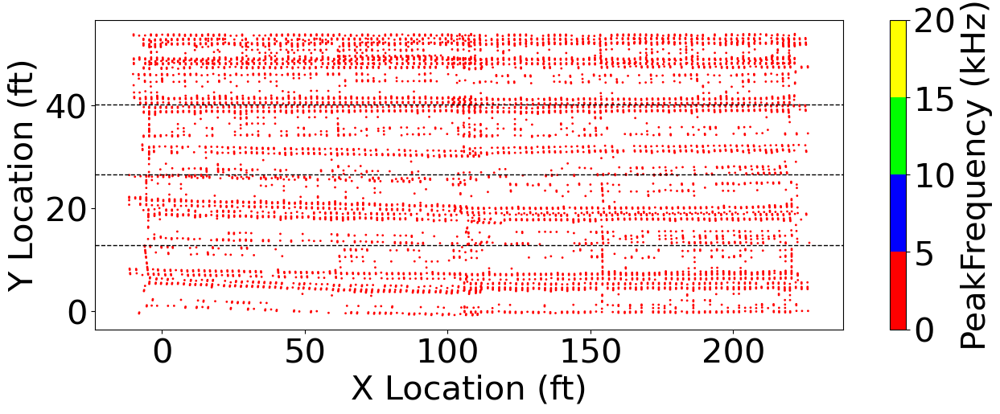

In [39]:
data_ie = data_ie[data_ie['PeakFrequency'] < max_frequency_cluster_0]

x_ie = data_ie['XLocation'].values
y_ie = data_ie['YLocation'].values
z_ie = data_ie['PeakFrequency'].values

max_peak_frequency = z_ie.max()
levels = sorted([0, 5, 10, 15, 20])
colors_ie = ['#ff0000','#0000ff' , '#00ff00', '#ffff00']
custom_cmap_ie = ListedColormap(colors_ie)
norm = BoundaryNorm(levels, ncolors=len(colors_ie), clip=True)

plt.rcParams.update({'font.size':30})
plt.figure(figsize=(15, 5))
scatter = plt.scatter(x_ie, y_ie, c=z_ie, cmap=custom_cmap_ie, norm=norm, s=1)
cbar = plt.colorbar(scatter, ticks=[0, 5, 10, 15, 20])
cbar.set_label('PeakFrequency (kHz)')
plt.xlabel('X Location (ft)', fontsize=30)
plt.ylabel('Y Location (ft)', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
#plt.title('PeakFrequency Scatter Plot', fontsize=30)
y_min, y_max = y_ie.min(), y_ie.max()
lane_height = (y_max - y_min) / 4
for i in range(1, 4):
    boundary_y = y_min + i * lane_height
    plt.axhline(y=boundary_y, color='black', linestyle='--', linewidth=1)

plt.show()

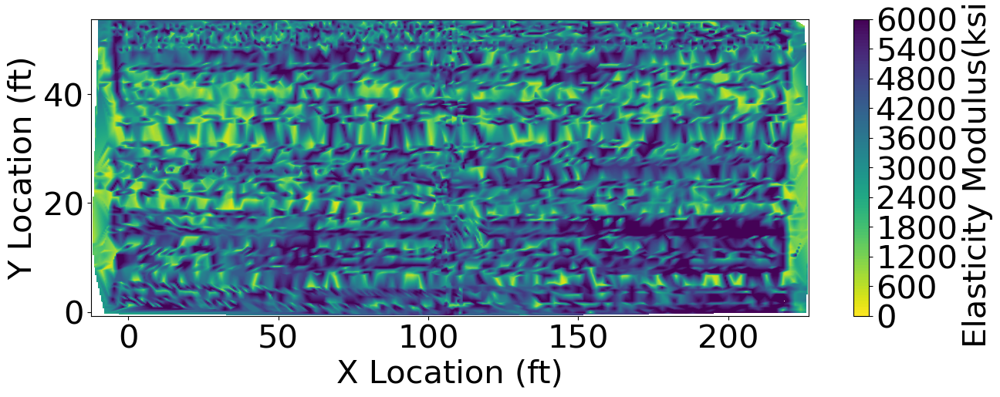

In [40]:
from matplotlib.cm import viridis_r
data_usw = pd.read_csv("C:/Users/datta/Downloads/28-000002_2019-05-21_USW_reconstructed.csv")
x_usw = data_usw['XLocation']
y_usw = data_usw['YLocation']
z_usw = data_usw['ElasticityModulus']

z_clipped = np.clip(z_usw, 0, 6000)

xi = np.linspace(x_usw.min(), x_usw.max(), 500)
yi = np.linspace(y_usw.min(), y_usw.max(), 500)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((x_usw, y_usw), z_clipped, (xi, yi), method='linear')

colors = ['#ff0000', '#ff6600', '#ffcc00', '#00ff66', '#00ffff', '#0066ff',
          '#0000ff', '#6600ff', '#9900ff', '#cc00ff']
custom_cmap = LinearSegmentedColormap.from_list("custom_scale", colors)

levels = np.linspace(0, 6000, 100)
cbar_ticks = np.linspace(0, 6000, 11)

plt.figure(figsize=(15, 5))
contour = plt.contourf(xi, yi, zi, levels=levels, cmap=viridis_r)
cbar = plt.colorbar(contour, ticks=cbar_ticks)
cbar.set_label('Elasticity Modulus(ksi)')
plt.xlabel('X Location (ft)', fontsize=30)
plt.ylabel('Y Location (ft)', fontsize=30)
#plt.title('Modulus of Elasticity', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()


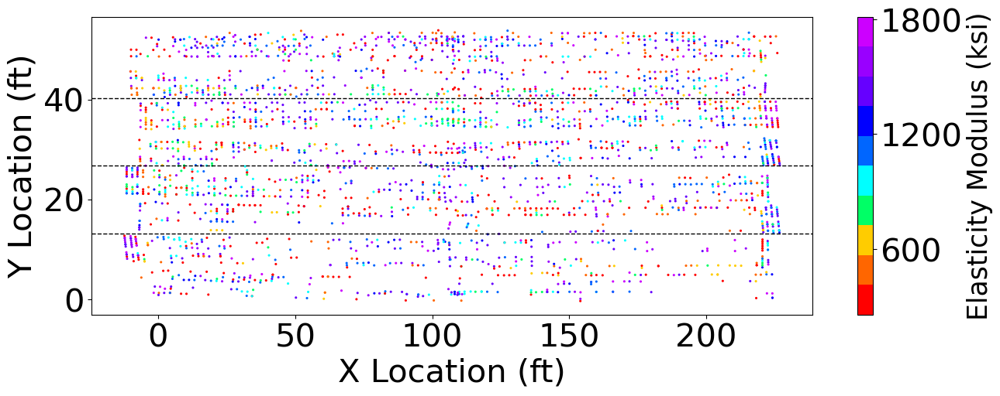

In [41]:
plt.rcParams.update({'font.size': 30})

data_usw = data_usw[data_usw['ElasticityModulus'] < 2000]

x_usw = data_usw['XLocation']
y_usw = data_usw['YLocation']
z_usw = data_usw['ElasticityModulus']
z_clipped = np.clip(z_usw, 0, 6000)
colors = ['#ff0000', '#ff6600', '#ffcc00', '#00ff66', '#00ffff', '#0066ff', '#0000ff', '#6600ff', '#9900ff', '#cc00ff']
custom_cmap = ListedColormap(colors)
levels = np.linspace(0, 6000, 11)
norm = BoundaryNorm(levels, ncolors=custom_cmap.N, clip=True)

plt.figure(figsize=(15, 5))
sc = plt.scatter(x_usw, y_usw, c=z_clipped, cmap=custom_cmap, s=5, edgecolor='none')
cbar = plt.colorbar(sc, ticks=levels)
cbar.set_label('Elasticity Modulus (ksi)', fontsize=25)
plt.xlabel('X Location (ft)')
plt.ylabel('Y Location (ft)')
#plt.title('Scatter Plot of Elasticity Modulus with Consistent Color Scale')
y_min, y_max = y_usw.min(), y_usw.max()
lane_height = (y_max - y_min) / 4
for i in range(1, 4):
    boundary_y = y_min + i * lane_height
    plt.axhline(y=boundary_y, color='black', linestyle='--', linewidth=1)
plt.show()


In [42]:
y_min = min(data_ie['YLocation'].min(), data_usw['YLocation'].min())
y_max = max(data_ie['YLocation'].max(), data_usw['YLocation'].max())
lane_height = (y_max - y_min) / 4
unified_boundaries = [y_min + i * lane_height for i in range(1, 4)]

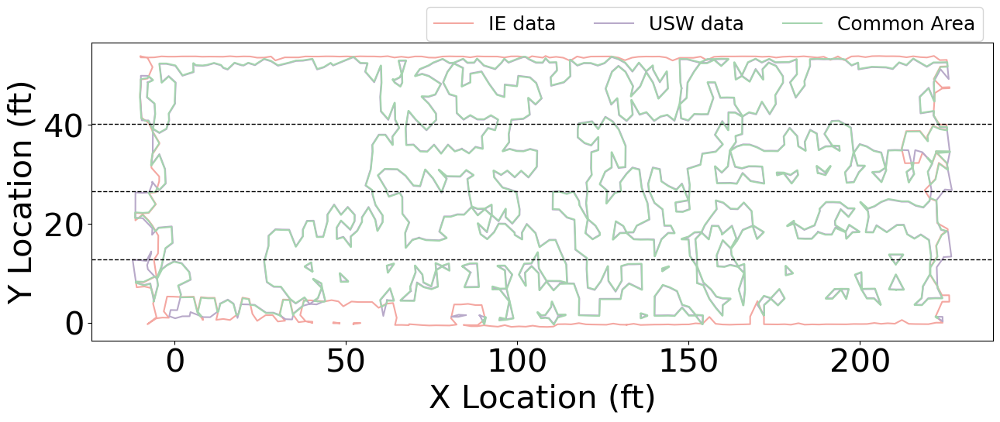

In [43]:
points1 = data_ie[['XLocation', 'YLocation']].values
points2 = data_usw[['XLocation', 'YLocation']].values
np.random.seed(0)

alpha_value = 0.5

alpha_shape1 = alphashape.alphashape(points1, alpha_value)
alpha_shape2 = alphashape.alphashape(points2, alpha_value)

common_area = alpha_shape1.intersection(alpha_shape2)

buffer_distance = 0.1
common_area = common_area.buffer(buffer_distance)

plt.figure(figsize=(15, 5))

if isinstance(alpha_shape1, Polygon):
    x1, y1 = alpha_shape1.exterior.xy
    plt.plot(x1, y1, color='#F4A7A1', label='IE data')
elif isinstance(alpha_shape1, MultiPolygon):
    for i, polygon in enumerate(alpha_shape1.geoms):
        x1, y1 = polygon.exterior.xy
        if i == 0:
            plt.plot(x1, y1, color='#F4A7A1', label='IE data')
        else:
            plt.plot(x1, y1, color='#F4A7A1')

if isinstance(alpha_shape2, Polygon):
    x2, y2 = alpha_shape2.exterior.xy
    plt.plot(x2, y2, color='#B8A9C9', label='USW data')
elif isinstance(alpha_shape2, MultiPolygon):
    for i, polygon in enumerate(alpha_shape2.geoms):
        x2, y2 = polygon.exterior.xy
        if i == 0:
            plt.plot(x2, y2, color='#B8A9C9', label='USW data')
        else:
            plt.plot(x2, y2, color='#B8A9C9')

if isinstance(common_area, Polygon):
    x_common, y_common = common_area.exterior.xy
    plt.plot(x_common, y_common, color='#A4D4AE', label='Common Area')
elif isinstance(common_area, MultiPolygon):
    for i, polygon in enumerate(common_area.geoms):
        x_common, y_common = polygon.exterior.xy
        if i == 0:
            plt.plot(x_common, y_common, color='#A4D4AE', label='Common Area')
        else:
            plt.plot(x_common, y_common, color='#A4D4AE')

for boundary_y in unified_boundaries:
    plt.axhline(y=boundary_y, color='black', linestyle='--', linewidth=1)

plt.xlabel('X Location (ft)', fontsize=30)
plt.ylabel('Y Location (ft)', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.legend(loc='upper right', bbox_to_anchor=(1, 1.15), ncol=3, fontsize=18)

plt.show()


Number of points from data_ie in the common area: 3637
Number of points from data_usw in the common area: 2412


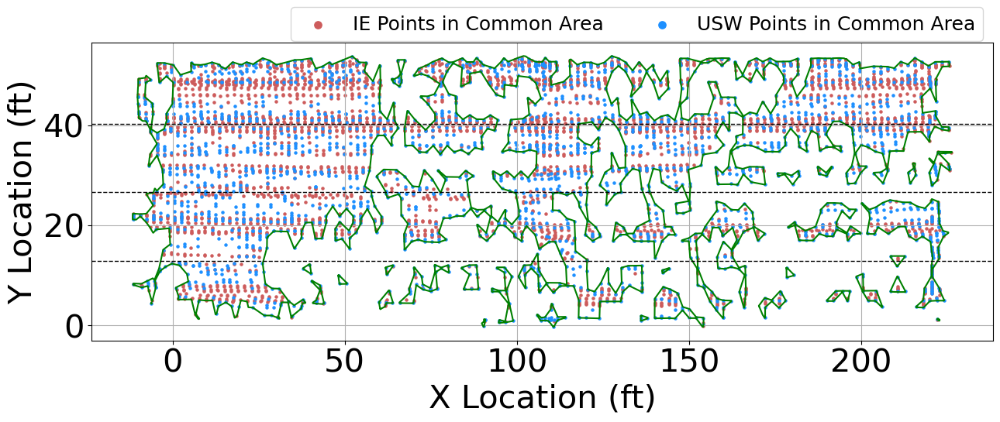

In [44]:
points1_shapely = [Point(xy) for xy in data_ie[['XLocation', 'YLocation']].values]
points2_shapely = [Point(xy) for xy in data_usw[['XLocation', 'YLocation']].values]
common_points_data_ie = [point for point in points1_shapely if common_area.contains(point)]
common_points_data_usw = [point for point in points2_shapely if common_area.contains(point)]

print(f"Number of points from data_ie in the common area: {len(common_points_data_ie)}")
print(f"Number of points from data_usw in the common area: {len(common_points_data_usw)}")

plt.figure(figsize=(15, 5))

if isinstance(common_area, Polygon):
    plt.plot(*common_area.exterior.xy, color='green', label='Common Area')
elif isinstance(common_area, MultiPolygon):
    for polygon in common_area.geoms:
        plt.plot(*polygon.exterior.xy, color='green')

if common_points_data_ie:
    x1, y1 = zip(*[(p.x, p.y) for p in common_points_data_ie])
    plt.scatter(x1, y1, color='#CD5C5C', label='IE Points in Common Area', s=5)
else:
    print("No points from data_ie in the common area.")

if common_points_data_usw:
    x2, y2 = zip(*[(p.x, p.y) for p in common_points_data_usw])
    plt.scatter(x2, y2, color='#1E90FF', label='USW Points in Common Area', s=5)
else:
    print("No points from data_usw in the common area.")

for boundary_y in unified_boundaries:
    plt.axhline(y=boundary_y, color='black', linestyle='--', linewidth=1)

plt.xlabel('X Location (ft)', fontsize=30)
plt.ylabel('Y Location (ft)', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.legend(loc='upper right', bbox_to_anchor=(1, 1.15), ncol=3, fontsize=18, markerscale=3)
plt.grid(True)
plt.show()


In [47]:
data_ie['geometry'] = data_ie.apply(lambda row: Point(row['XLocation'], row['YLocation']), axis=1)
data_usw['geometry'] = data_usw.apply(lambda row: Point(row['XLocation'], row['YLocation']), axis=1)

if 'geometry' not in cluster_0_df.columns:
    cluster_0_df['geometry'] = cluster_0_df.apply(lambda row: Point(row['XLocation'], row['YLocation']), axis=1)

data_ie_common = cluster_0_df[cluster_0_df['geometry'].apply(lambda point: common_area.contains(point))]
data_usw_common = data_usw[data_usw['geometry'].apply(lambda point: common_area.contains(point))]

fused_defective_locations = pd.concat([data_ie_common, data_usw_common], ignore_index=True)
fused_defective_locations = fused_defective_locations.drop_duplicates(subset=['XLocation', 'YLocation'])
fused_defective_locations = fused_defective_locations.drop(columns=['geometry'])

print("\nFused defective locations within the common area:")
print(fused_defective_locations)



Fused defective locations within the common area:
       XLocation  YLocation  PeakFrequency  ElasticityModulus
0     118.078101   3.965266       1.956947                NaN
1     118.083991   4.183920       1.174168                NaN
2     118.089882   4.402608       1.174168                NaN
3     118.095772   4.621262       0.782779                NaN
4     118.113443   5.277290       1.956947                NaN
...          ...        ...            ...                ...
6074    0.175048  51.958749            NaN        1258.952865
6075   -1.761460  49.899801            NaN         374.564489
6076   -3.773560  48.638421            NaN         805.729834
6077   -7.869168  48.622287            NaN        1160.250961
6078   -9.860378  48.641047            NaN         278.799250

[5884 rows x 4 columns]


CROSS VERIFICATION USING IMAGE PROCESSING

IE Image loaded successfully with shape: (908, 1200, 3)
USW Image loaded successfully with shape: (918, 1200, 3)


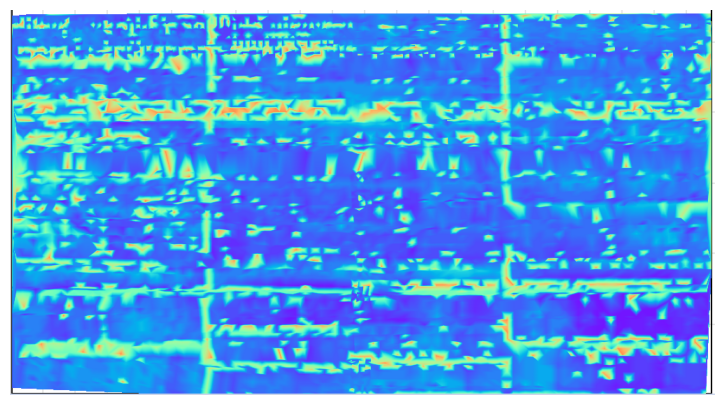

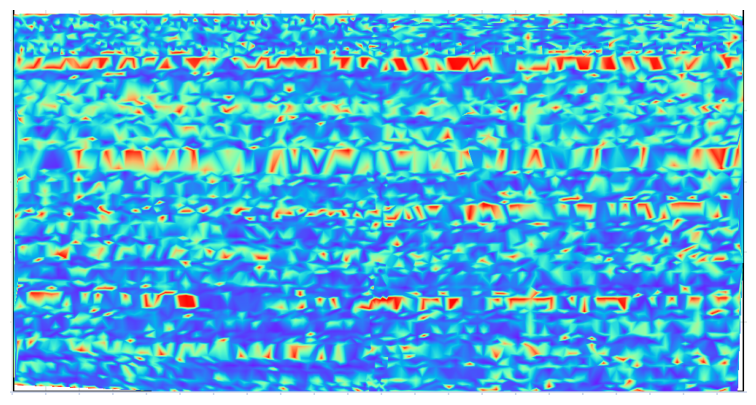

In [49]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

ie_image_path =  "C:/Users/datta/OneDrive - George Mason University - O365 Production/summer Internship/DATA/Images/28-000001_2019-05-20_IE.png"
usw_image_path = "C:/Users/datta/OneDrive - George Mason University - O365 Production/summer Internship/DATA/Images/28-000001_2019-05-20_USW.png"

ie_image = cv2.imread(ie_image_path)
usw_image = cv2.imread(usw_image_path)

if ie_image is None:
    print(f"Error: Unable to load IE image at {ie_image_path}")
else:
    print(f"IE Image loaded successfully with shape: {ie_image.shape}")

if usw_image is None:
    print(f"Error: Unable to load USW image at {usw_image_path}")
else:
    print(f"USW Image loaded successfully with shape: {usw_image.shape}")

lower_red1 = np.array([0, 100, 100])
upper_red1 = np.array([10, 255, 255])
lower_red2 = np.array([170, 100, 100])
upper_red2 = np.array([180, 255, 255])
lower_bound = np.array([0, 30, 100])
upper_bound = np.array([40, 255, 255])

def detect_defects_with_darkred_bounding_boxes(image, lower_red1, upper_red1, lower_red2, upper_red2, lower_bound, upper_bound):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
    mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
    red_mask = mask1 | mask2
    gradient_mask = cv2.inRange(hsv, lower_bound, upper_bound)
    combined_mask = red_mask | gradient_mask
    contours, _ = cv2.findContours(combined_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    dark_red = (139, 0, 0)
    boxed_image = image.copy()
    bounding_boxes = []
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(boxed_image, (x, y), (x + w, y + h), dark_red, 2)
        bounding_boxes.append(((x, y), (x + w, y + h)))

    return boxed_image, combined_mask, bounding_boxes

ie_boxed_darkred, ie_mask, ie_bounding_boxes = detect_defects_with_darkred_bounding_boxes(
    ie_image, lower_red1, upper_red1, lower_red2, upper_red2, lower_bound, upper_bound)
usw_boxed_darkred, usw_mask, usw_bounding_boxes = detect_defects_with_darkred_bounding_boxes(
    usw_image, lower_red1, upper_red1, lower_red2, upper_red2, lower_bound, upper_bound)

def crop_to_defective_area_with_margin(image, mask, margin=5):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        x_min = min([cv2.boundingRect(c)[0] for c in contours]) - margin
        y_min = min([cv2.boundingRect(c)[1] for c in contours]) - margin
        x_max = max([cv2.boundingRect(c)[0] + cv2.boundingRect(c)[2] for c in contours]) + margin
        y_max = max([cv2.boundingRect(c)[1] + cv2.boundingRect(c)[3] for c in contours]) + margin

        x_min = max(x_min, 0)
        y_min = max(y_min, 0)
        x_max = min(x_max, image.shape[1] - 1)
        y_max = min(y_max, image.shape[0] - 1)

        cropped_image = image[y_min:y_max, x_min:x_max]
    else:

        cropped_image = image
        x_min, y_min = 0, 0
        x_max, y_max = image.shape[1] - 1, image.shape[0] - 1

    return cropped_image, x_min, y_min, x_max, y_max

ie_cropped_precise, ie_xmin, ie_ymin, ie_xmax, ie_ymax = crop_to_defective_area_with_margin(ie_image, ie_mask, margin=5)
usw_cropped_precise, usw_xmin, usw_ymin, usw_xmax, usw_ymax = crop_to_defective_area_with_margin(usw_image, usw_mask, margin=5)


def display_cropped_result(image, title):
    plt.figure(figsize=(15, 5))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), origin='upper')
    #plt.title(f"{title}")
    plt.axis('off')
    plt.show()

display_cropped_result(ie_cropped_precise, "Impact-echo (IE) - Cropped to Defective Areas")


display_cropped_result(usw_cropped_precise, "Ultrasonic Surface Waves (USW) - Cropped to Defective Areas")


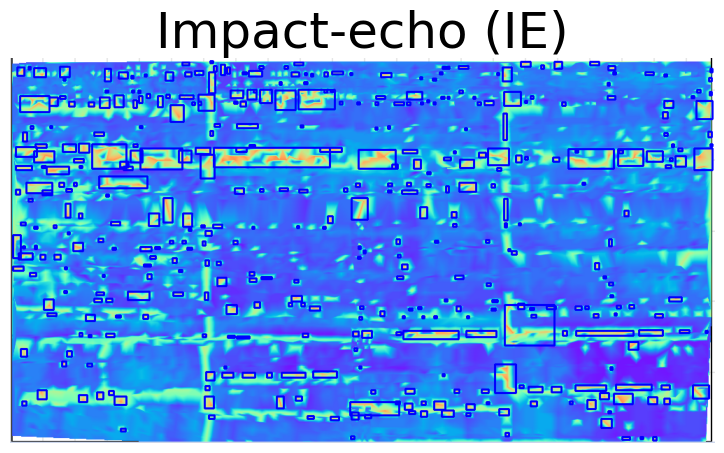

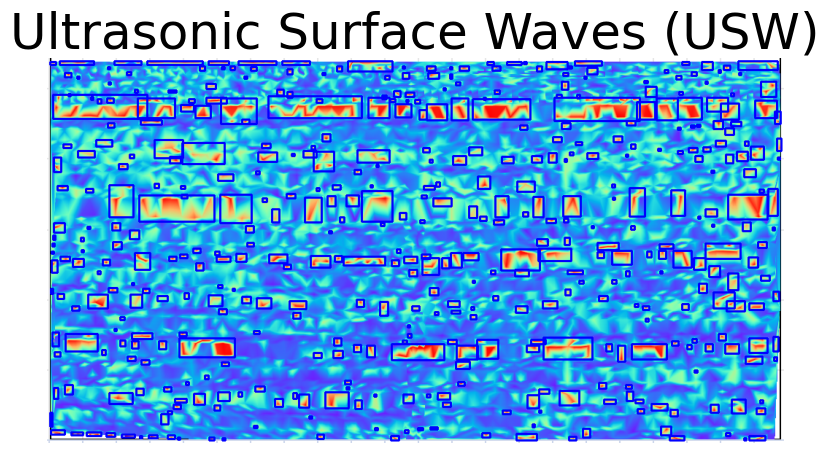

In [50]:
data_ie_path = "C:/Users/datta/Downloads/28-000001_2019-05-20_IE_reconstructed.csv"
data_usw_path = "C:/Users/datta/Downloads/28-000002_2019-05-21_USW_reconstructed.csv"


def calculate_adaptive_params(image):

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 50, 150)
    edge_density = np.sum(edges) / edges.size

    if edge_density < 0.05:
        kernel_size = (7, 7)
        iterations = 2
    elif edge_density < 0.1:
        kernel_size = (5, 5)
        iterations = 2
    else:
        kernel_size = (3, 3)
        iterations = 1

    return kernel_size, iterations

def detect_defects_with_adaptive_morphology(image, lower_red1, upper_red1, lower_red2, upper_red2, lower_bound, upper_bound, x_axis_range=None, y_axis_range=None):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)


    mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
    mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
    red_mask = mask1 | mask2
    gradient_mask = cv2.inRange(hsv, lower_bound, upper_bound)
    combined_mask = red_mask | gradient_mask


    kernel_size, iterations = calculate_adaptive_params(image)
    kernel = np.ones(kernel_size, np.uint8)

    combined_mask = cv2.dilate(combined_mask, kernel, iterations=iterations)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)

    contours, _ = cv2.findContours(combined_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    annotated_image = image.copy()
    bounding_boxes = []
    height, width = image.shape[:2]


    if x_axis_range and y_axis_range:
        x_min, x_max = x_axis_range
        y_min, y_max = y_axis_range
        x_scale = (x_max - x_min) / width
        y_scale = (y_max - y_min) / height
    else:
        x_min, x_max, y_min, y_max, x_scale, y_scale = 0, width, 0, height, 1, 1  # Defaults

    for i, contour in enumerate(contours):
        x, y, w, h = cv2.boundingRect(contour)
        area = cv2.contourArea(contour)
        cv2.rectangle(annotated_image, (x, y), (x + w, y + h), (255, 0, 0), 2)

        if area > 40:

            x_data_min = x * x_scale + x_min
            x_data_max = (x + w) * x_scale + x_min
            y_data_min = (height - (y + h)) * y_scale + y_min
            y_data_max = (height - y) * y_scale + y_min
            centroid_x = (x + w / 2) * x_scale + x_min
            centroid_y = (height - (y + h / 2)) * y_scale + y_min
            radius = min(w / 2, h / 2)

            bounding_boxes.append({
                "Region ID": i + 1,
                "Bounding Box (Data Coordinates)": (x_data_min, y_data_min, x_data_max, y_data_max),
                "Area (pixels)": area,
                "Centroid (Data Coordinates)": (centroid_x, centroid_y),
                "Inscribed Circle Radius": radius
            })

    return annotated_image, combined_mask, bounding_boxes

def calculate_axes_ranges_from_csv(csv_path):
    data = pd.read_csv(csv_path)
    x_axis_range = (data['XLocation'].min(), data['XLocation'].max())
    y_axis_range = (data['YLocation'].min(), data['YLocation'].max())
    return x_axis_range, y_axis_range

x_axis_range_ie, y_axis_range_ie = calculate_axes_ranges_from_csv(data_ie_path)
x_axis_range_usw, y_axis_range_usw = calculate_axes_ranges_from_csv(data_usw_path)

ie_cropped_boxed, ie_cropped_mask, ie_bounding_boxes_cropped = detect_defects_with_adaptive_morphology(
    ie_cropped_precise, lower_red1, upper_red1, lower_red2, upper_red2, lower_bound, upper_bound,
    x_axis_range_ie, y_axis_range_ie)

usw_cropped_boxed, usw_cropped_mask, usw_bounding_boxes_cropped = detect_defects_with_adaptive_morphology(
    usw_cropped_precise, lower_red1, upper_red1, lower_red2, upper_red2, lower_bound, upper_bound,
    x_axis_range_usw, y_axis_range_usw)


def display_defective_areas_on_cropped(image, mask, title):
    plt.figure(figsize=(15, 5))
    if image is None or image.size == 0:
        print(f"Error: The image for '{title}' is invalid or empty.")
        return
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), origin='upper')
    plt.title(f"{title}")
    plt.axis('off')
    plt.show()

display_defective_areas_on_cropped(ie_cropped_boxed, ie_cropped_mask, "Impact-echo (IE)")

display_defective_areas_on_cropped(usw_cropped_boxed, usw_cropped_mask, "Ultrasonic Surface Waves (USW)")


In [51]:
def map_pixel_to_data_coordinates(x_pixel, y_pixel, x_range, y_range, cropped_width, cropped_height, x_min_crop, y_min_crop):
    # Adjust pixel coordinates for cropping and orientation
    x_pixel_adjusted = x_pixel + x_min_crop
    y_pixel_adjusted = cropped_height - (y_pixel + y_min_crop)  # Invert Y-axis orientation

    # Calculate data coordinates using floating-point arithmetic for subpixel precision
    x_data = x_range[0] + (x_pixel_adjusted / cropped_width) * (x_range[1] - x_range[0])
    y_data = y_range[0] + (y_pixel_adjusted / cropped_height) * (y_range[1] - y_range[0])

    return x_data, y_data

Calculated x-axis range for IE: (-12.2971265447, 226.853169126)
Calculated y-axis range for IE: (-0.835184598949, 53.9603073877)
Calculated x-axis range for USW: (-12.2744571086, 226.823325855)
Calculated y-axis range for USW: (-0.729593677213, 53.8509680874)


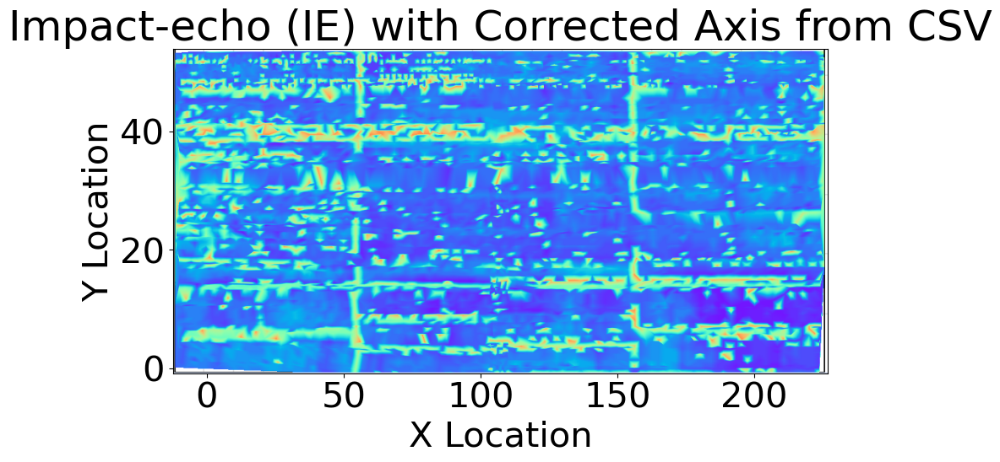

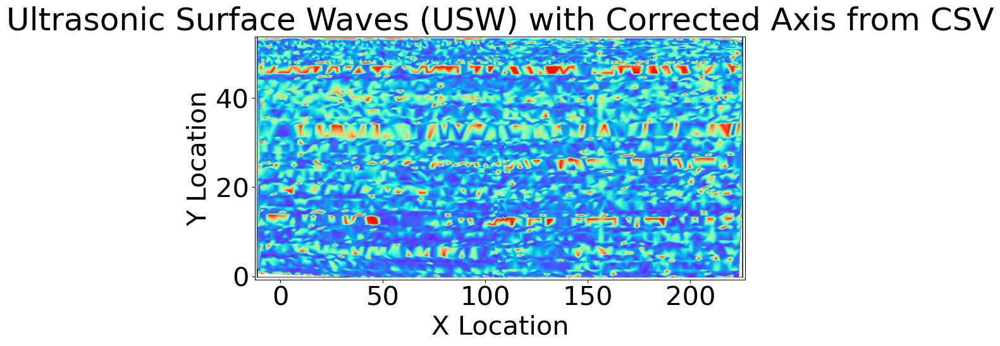

In [52]:

data_ie = pd.read_csv(data_ie_path)
data_usw = pd.read_csv(data_usw_path)


ie_x_axis_range = (data_ie['XLocation'].min(), data_ie['XLocation'].max())
ie_y_axis_range = (data_ie['YLocation'].min(), data_ie['YLocation'].max())

usw_x_axis_range = (data_usw['XLocation'].min(), data_usw['XLocation'].max())
usw_y_axis_range = (data_usw['YLocation'].min(), data_usw['YLocation'].max())

print(f"Calculated x-axis range for IE: {ie_x_axis_range}")
print(f"Calculated y-axis range for IE: {ie_y_axis_range}")
print(f"Calculated x-axis range for USW: {usw_x_axis_range}")
print(f"Calculated y-axis range for USW: {usw_y_axis_range}")


def calculate_cropped_axes_ranges(x_range, y_range, x_min, x_max, y_min, y_max, full_width, full_height):

    x_range_cropped = (
        x_range[0] + (x_min / full_width) * (x_range[1] - x_range[0]),
        x_range[0] + (x_max / full_width) * (x_range[1] - x_range[0])
    )

    y_range_cropped = (
        y_range[1] - (y_min / full_height) * (y_range[1] - y_range[0]),
        y_range[1] - (y_max / full_height) * (y_range[1] - y_range[0])
    )

    return x_range_cropped, y_range_cropped


ie_full_height, ie_full_width = ie_image.shape[:2]
usw_full_height, usw_full_width = usw_image.shape[:2]


ie_x_range_cropped, ie_y_range_cropped = calculate_cropped_axes_ranges(
    ie_x_axis_range, ie_y_axis_range, ie_xmin, ie_xmax, ie_ymin, ie_ymax, ie_full_width, ie_full_height)

usw_x_range_cropped, usw_y_range_cropped = calculate_cropped_axes_ranges(
    usw_x_axis_range, usw_y_axis_range, usw_xmin, usw_xmax, usw_ymin, usw_ymax, usw_full_width, usw_full_height)

ie_x_range = ie_x_axis_range
usw_x_range = usw_x_axis_range


ie_y_range = ie_y_axis_range
usw_y_range = usw_y_axis_range


def display_image_with_fixed_axes(image, x_range, y_range, title):
    plt.figure(figsize=(10, 5))
    if image is None or image.size == 0:
        print(f"Error: The image for '{title}' is invalid or empty.")
        return

    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
               extent=[x_range[0], x_range[1], y_range[0], y_range[1]],
               aspect='auto',
               origin='upper')
    plt.title(title)
    plt.xlabel("X Location")
    plt.ylabel("Y Location")
    plt.axis('on')
    plt.show()


display_image_with_fixed_axes(ie_cropped_precise, ie_x_range, ie_y_range, "Impact-echo (IE) with Corrected Axis from CSV")


display_image_with_fixed_axes(usw_cropped_precise, usw_x_range, usw_y_range, "Ultrasonic Surface Waves (USW) with Corrected Axis from CSV")


In [53]:

ie_points = fused_defective_locations[fused_defective_locations['PeakFrequency'].notnull()]
usw_points = fused_defective_locations[fused_defective_locations['ElasticityModulus'].notnull()]


def plot_fusion_defective_locations(image, x_range, y_range, title, points, color, label):

    plt.figure(figsize=(15, 5))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
               extent=[x_range[0], x_range[1], y_range[0], y_range[1]],
               aspect='auto',
               origin='upper')

    plt.scatter(points['XLocation'], points['YLocation'], color=color, marker='o', s=5, label=label)
    plt.title(title)
    plt.xlabel("X Location")
    plt.ylabel("Y Location")
    plt.legend()
    plt.axis('on')
    plt.show()


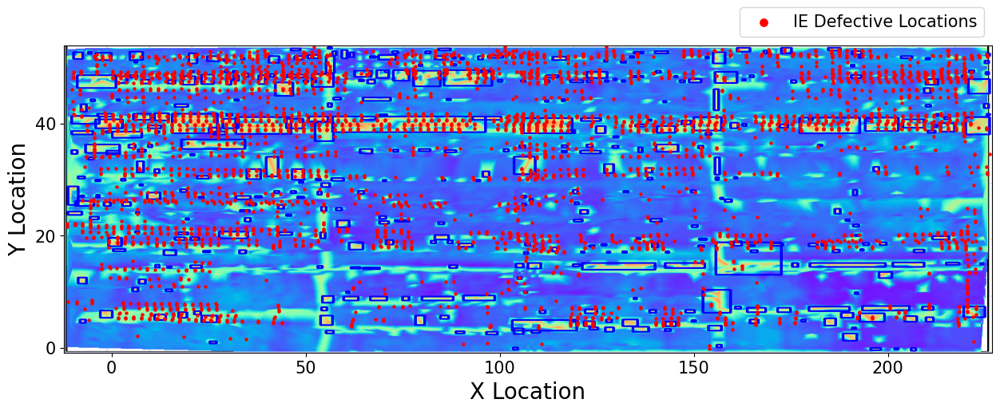

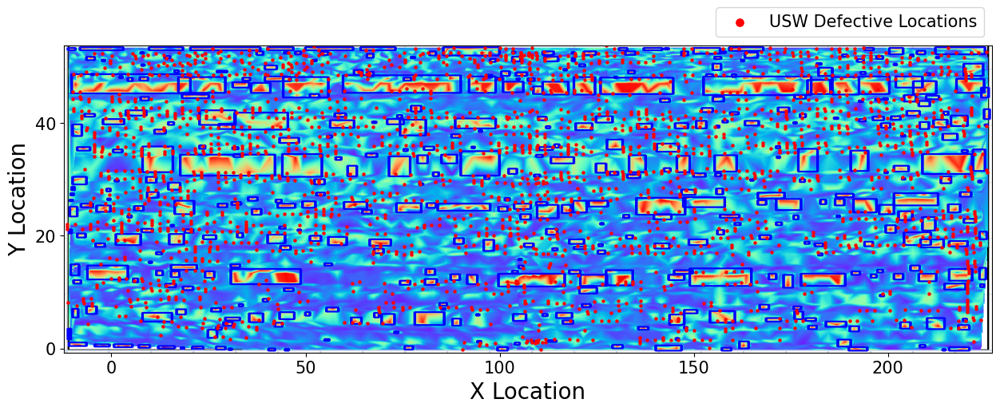

In [54]:
def plot_fusion_with_bounding_boxes(image, x_range, y_range, title, fusion_data, color, label):
    plt.figure(figsize=(15, 5))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
               extent=[x_range[0], x_range[1], y_range[0], y_range[1]],
               aspect='auto',
               origin='upper')

    plt.scatter(fusion_data['XLocation'], fusion_data['YLocation'], color=color, marker='o', s=5, label=label)
    # plt.title(title)
    plt.xlabel("X Location", fontsize=20)
    plt.ylabel("Y Location", fontsize=20)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.legend(loc='upper right', bbox_to_anchor=(1, 1.15), ncol=3, fontsize=15, markerscale=3)
    plt.axis('on')
    plt.show()


plot_fusion_with_bounding_boxes(ie_cropped_boxed, ie_x_range, ie_y_range,
                                "Impact-echo (IE) with Bounding Boxes and Fusion Defective Locations",
                                ie_points, color='red', label="IE Defective Locations")

plot_fusion_with_bounding_boxes(usw_cropped_boxed, usw_x_range, usw_y_range,
                                "Ultrasonic Surface Waves (USW) with Bounding Boxes and Fusion Defective Locations",
                                usw_points, color='red', label="USW Defective Locations")


EVALUATION METRICS

In [56]:
def compute_confusion_matrix(fusion_data_df, detected_regions_df, tolerance):
    TP = 0
    FP = 0
    FN = 0

    detected_centroids = np.array([region['Centroid (Data Coordinates)'] for region in detected_regions_df])

    fusion_points = fusion_data_df[['XLocation', 'YLocation']].values

    matched_detected = set()
    for idx, fusion_point in enumerate(fusion_points):
        distances = np.linalg.norm(detected_centroids - fusion_point, axis=1)
        min_distance = np.min(distances)
        if min_distance <= tolerance:
            TP += 1
            matched_idx = np.argmin(distances)
            matched_detected.add(matched_idx)
        else:
            FP += 1

    FN = len(detected_centroids) - len(matched_detected)

    return TP, FP, FN

def plot_defects_with_evaluation(image, x_range, y_range, ground_truth_regions, fusion_data, tolerance, title):
    plt.figure(figsize=(15, 5))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
               extent=[x_range[0], x_range[1], y_range[0], y_range[1]],
               aspect='auto',
               origin='upper')


    ground_truth_plotted = False
    true_positive_plotted = False
    false_positive_plotted = False


    for region in ground_truth_regions:
        centroid = region['Centroid (Data Coordinates)']
        if not ground_truth_plotted:
            plt.plot(centroid[0], centroid[1], 'go', label='Ground Truth Defect')
            ground_truth_plotted = True
        else:
            plt.plot(centroid[0], centroid[1], 'go')

    fusion_points = fusion_data[['XLocation', 'YLocation']].values
    for fusion_point in fusion_points:
        distances = np.linalg.norm(
            [region['Centroid (Data Coordinates)'] for region in ground_truth_regions] - fusion_point, axis=1)
        if np.any(distances <= tolerance):
            if not true_positive_plotted:
                plt.plot(fusion_point[0], fusion_point[1], 'bo', label='True Positive')
                true_positive_plotted = True
            else:
                plt.plot(fusion_point[0], fusion_point[1], 'bo')
        else:
            if not false_positive_plotted:
                plt.plot(fusion_point[0], fusion_point[1], 'rx', label='False Positive')
                false_positive_plotted = True
            else:
                plt.plot(fusion_point[0], fusion_point[1], 'rx')

    plt.title(title, fontsize=30)
    plt.xlabel('X Location (ft)', fontsize=30)
    plt.ylabel('Y Location (ft)', fontsize=30)
    plt.legend(fontsize=30)
    plt.show()

def calculate_evaluation_metrics(TP, FP, FN):
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    f1_score = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    return precision, recall, f1_score

detected_regions_ie = ie_bounding_boxes_cropped

fusion_data_ie = fused_defective_locations[fused_defective_locations['PeakFrequency'].notnull()]

tolerance_ie = np.mean([region['Inscribed Circle Radius'] for region in detected_regions_ie])

TP_ie, FP_ie, FN_ie = compute_confusion_matrix(fusion_data_ie, detected_regions_ie, tolerance_ie)

precision_ie, recall_ie, f1_score_ie = calculate_evaluation_metrics(TP_ie, FP_ie, FN_ie)

print(f"IE Evaluation Metrics:")
print(f"True Positives: {TP_ie}, False Positives: {FP_ie}, False Negatives: {FN_ie}")
print(f"Precision: {precision_ie:.2f}, Recall: {recall_ie:.2f}, F1-Score: {f1_score_ie:.2f}")

#plot_defects_with_evaluation(ie_cropped_boxed, ie_x_range, ie_y_range, detected_regions_ie, fusion_data_ie, tolerance_ie, "IE Defects Evaluation")

detected_regions_usw = usw_bounding_boxes_cropped  # Already in data coordinates

fusion_data_usw = fused_defective_locations[fused_defective_locations['ElasticityModulus'].notnull()]

tolerance_usw = np.mean([region['Inscribed Circle Radius'] for region in detected_regions_usw])

TP_usw, FP_usw, FN_usw = compute_confusion_matrix(fusion_data_usw, detected_regions_usw, tolerance_usw)

precision_usw, recall_usw, f1_score_usw = calculate_evaluation_metrics(TP_usw, FP_usw, FN_usw)

print(f"\nUSW Evaluation Metrics:")
print(f"True Positives: {TP_usw}, False Positives: {FP_usw}, False Negatives: {FN_usw}")
print(f"Precision: {precision_usw:.2f}, Recall: {recall_usw:.2f}, F1-Score: {f1_score_usw:.2f}")

#plot_defects_with_evaluation(usw_cropped_boxed,usw_x_range,usw_y_range,detected_regions_usw,fusion_data_usw,tolerance_usw,"USW Defects Evaluation")

TP_total = TP_ie + TP_usw
FP_total = FP_ie + FP_usw
FN_total = FN_ie + FN_usw


precision_total, recall_total, f1_score_total = calculate_evaluation_metrics(TP_total, FP_total, FN_total)

print(f"\nCombined Evaluation Metrics (Micro-Averaged):")
print(f"True Positives: {TP_total}, False Positives: {FP_total}, False Negatives: {FN_total}")
print(f"Precision: {precision_total:.2f}, Recall: {recall_total:.2f}, F1-Score: {f1_score_total:.2f}")


IE Evaluation Metrics:
True Positives: 2725, False Positives: 942, False Negatives: 8
Precision: 0.74, Recall: 1.00, F1-Score: 0.85

USW Evaluation Metrics:
True Positives: 2089, False Positives: 128, False Negatives: 9
Precision: 0.94, Recall: 1.00, F1-Score: 0.97

Combined Evaluation Metrics (Micro-Averaged):
True Positives: 4814, False Positives: 1070, False Negatives: 17
Precision: 0.82, Recall: 1.00, F1-Score: 0.90
